In [0]:
import keras 
from keras.datasets import mnist 
import cv2
from matplotlib import pyplot as plt
import numpy as np
from scipy import ndimage

#1.a

In [0]:
(x_train, y_train), (_, _) = mnist.load_data()

#1.b

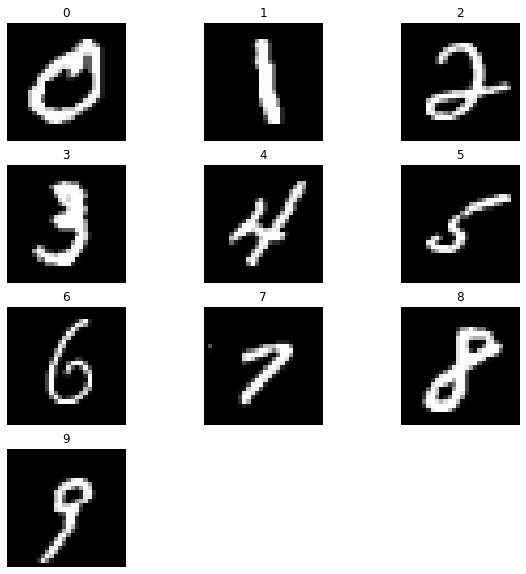

In [20]:
array_digits = []
for digit in range(10):
  x = np.argwhere(y_train == digit)
  array_digits.append(np.reshape(x, (x.shape[0])))

plt.figure(figsize=[10,10])
for i in range(10):
  plt.subplot(4,3,i+1)
  plt.imshow(x_train[array_digits[i][1]],cmap=plt.cm.gray)
  plt.title(str(i))
  plt.axis('off')

plt.show()

In [0]:
ndarray_y=[]
ndarray_x=[]
for j in range(101):
  for i in range(6005):
    digit=j%10
    dozen=int(((j%100)/10))
    hundred=int(j/100)
    x_data_digit=x_train[array_digits[digit][np.random.randint(array_digits[digit].size-1)]]
    x_data_dozen=x_train[array_digits[dozen][np.random.randint(array_digits[dozen].size-1)]]
    x_data_hundred=x_train[array_digits[hundred][np.random.randint(array_digits[hundred].size-1)]]
    x_data=np.zeros((x_train[0].shape[0],x_train[0].shape[1]*3))
    x_data[:28,:28]=x_data_hundred
    x_data[:28,28:56]=x_data_dozen
    x_data[:28,56:]=x_data_digit
    ndarray_x.append(x_data)
    ndarray_y.append(j)

In [0]:
#The new data set ndaaray_x is img and ndarray_y is label
ndarray_y=np.asarray(ndarray_y)
ndarray_x=np.asarray(ndarray_x)
array_new_digits=[]
for digit in range(101):
  x = np.argwhere(ndarray_y == digit)
  array_new_digits.append(np.reshape(x, (x.shape[0])))

#1.d

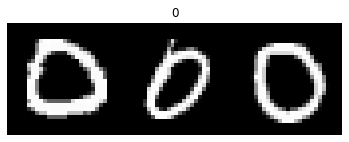

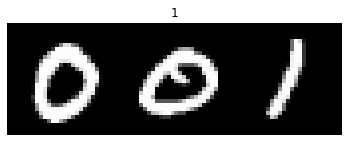

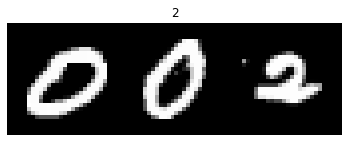

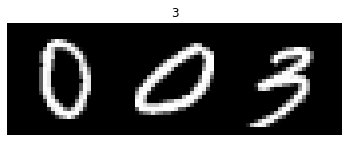

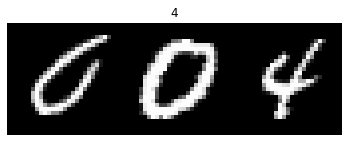

...

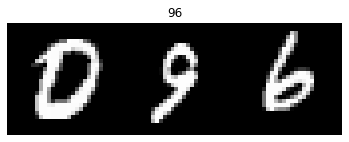

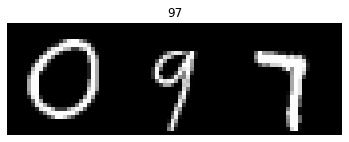

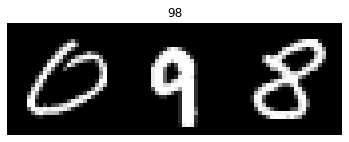

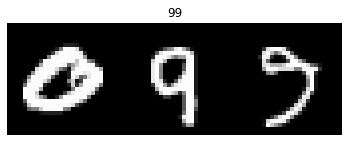

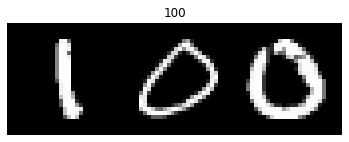

In [23]:
for num in range(101):
  plt.imshow(ndarray_x[array_new_digits[num][0]],cmap=plt.cm.gray)
  plt.title(str(num))
  plt.axis('off')
  plt.show()


#1.e

In [0]:
class augmentation():
  
  def __init__(self,img):
    self.img=img

  def flip(self,min_max_factor=(0,2),p=0.5):
    if self.prob(p):
      factor=self.random_min_to_max(min_max_factor[1],min_max_factor[0])
      return np.flip(self.img,axis=factor)
    return self.img

  def zoom_in(self,min_max_factor=(1,2),p=0.5):
    if self.prob(p):
      factor=self.random_min_to_max(min_max_factor[1],min_max_factor[0])
      shape=self.img.shape
      crop_y=shape[0]//factor
      crop_x= shape[1]//factor
      offset_x=np.random.randint(crop_x)
      offset_y=np.random.randint(crop_y)
      new_img=self.img[offset_y:min(offset_y+crop_y,shape[0]),offset_x:min(offset_x+crop_x,shape[1])]
      return cv2.resize(new_img,(shape[1],shape[0]))
    return self.img

  def Gaussian_Blur(self,min_max_factor=(3,7),p=0.5):
    if self.prob(p):
      factor=self.random_min_to_max(min_max_factor[1],min_max_factor[0])
      factor= (factor+1)%2+factor
      img_blur=cv2.GaussianBlur(self.img,(factor,factor),0)
      return img_blur
    return self.img

  def Median_blur(self,min_max_factor=(3,7),p=0.5):
    if self.prob(p):
      factor=self.random_min_to_max(min_max_factor[1],min_max_factor[0])
      factor= (factor+1)%2+factor
      return cv2.medianBlur(self.img,factor)
    return self.img

  def crop(self,min_max_factor=(1,2),p=0.5):
    if self.prob(p):
      factor=self.random_min_to_max(min_max_factor[1],min_max_factor[0])
      crop_y=self.img.shape[0]//factor
      crop_x= self.img.shape[1]//factor
      offset_x=np.random.randint(crop_x)
      offset_y=np.random.randint(crop_y)    
      return self.img[offset_y:min(offset_y+crop_y,self.img.shape[0]),offset_x:min(offset_x+crop_x,self.img.shape[1])]
    return self.img

  def rotate(self,min_max_factor=(0,90),p=0.5):
    if self.prob(p):
      angle=self.random_min_to_max(min_max_factor[1],min_max_factor[0])
      img=ndimage.rotate(self.img, angle, reshape=False)
      return img
    return self.img
  
  def random_min_to_max(self,n1_max,n1_min):
    n1=np.random.randint(n1_max-n1_min)+n1_min
    return n1

  def prob(self,p):
    c=np.random.random(1)
    if c < p:
      return True
    return False 

class create_aug(augmentation):
  def __init__(self, img, p_list, aug_list, list_factor):
        super().__init__(img)
        #string list of prob should be like size of list_aug
        self.list_p=p_list
        #should be like size of aug_list ,-1 use default
        self.list_factor=list_factor
        #string name of aug 
        self.aug_list=aug_list
        #method of super class
        self.dict_aug={'rotate':self.rotate,'crop':self.crop,'median':self.Median_blur,'gaussian':self.Gaussian_Blur,'flip':self.flip,'zoom':self.zoom_in}

  def compose(self):
    if len(self.list_factor) != len(self.list_p) and len(self.list_p) != len(self.aug_list):
      print("the size must be equal")
      return self.img
    img_org=self.img.copy()
    for i in range(len(self.aug_list)):
      method=self.dict_aug[self.aug_list[i]]
      if method is None:
        print("the name of aug don't exist")
        return self.img
      else:
        if self.list_factor[i] != -1:
          self.img=method(min_max_factor=self.list_factor[i],p=self.list_p[i])
        else:
          self.img=method(p=self.list_p[i])
    temp=self.img.copy()
    self.img=img_org.copy()
    return temp

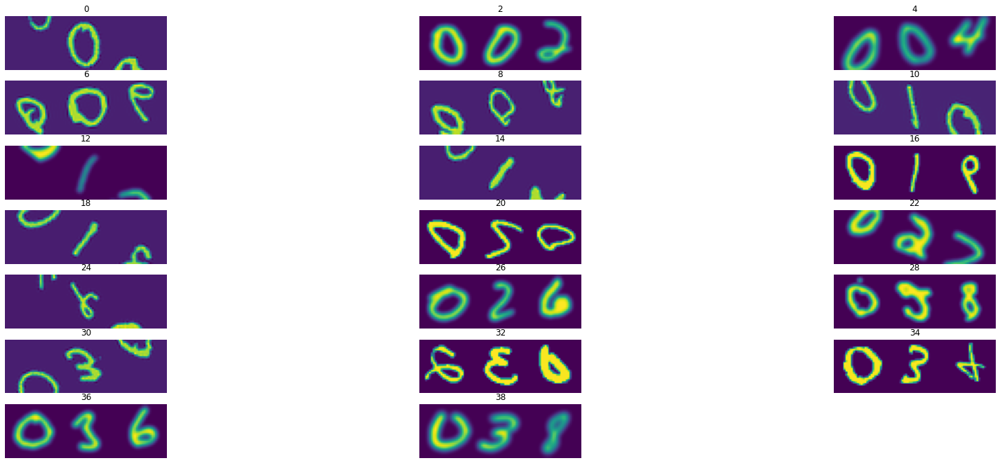

In [25]:
#Argument for Aug
list_aug_name_1=['gaussian','flip','rotate']
list_factor_1=[(3,7), (0,2), (315,405)]
p_list_1=[ 0.4, 0.5, 0.5]
#Object of aug
plt.figure(figsize=[30, 15])
for i in range(0,40,2):
  index=np.random.randint(6000)
  img=ndarray_x[array_new_digits[i][index]]
  img=np.float32(img)
  aug1=create_aug(img,p_list_1,list_aug_name_1,list_factor_1)
  plt.subplot(9,3,i/2+1)
  plt.imshow(aug1.compose())
  plt.title(str(i))
  plt.axis('off')
plt.show()

#Aug For Number

##zoom in
Do not use zoom for number augmentations,
Because we only grow some of the numbers and not all of them, and take part of the picture, if you can enlarge the picture so that the literature is not out of bounds then we can use.

##crop
Like zoom we take part of the image and it destroys the meaning of the image.

##rotate
We can use this aug between -45:45 approximately. 
The number can be rotate but now more than -45 or 45 destroy the meaning of image

##flip
Flip can't use, we can't read number if we do flip.

##gaussian
The gaussian gives us a lot of potential for pictures, but reduces details so we note that we will not reduce important details to us ie the numbers

##median
Clarifies the image for us thus creating a bigger data for us so we will use it as well as delete noise.

In [0]:
import scipy.signal
from skimage.util import random_noise
class Augmentation_two():

  def __init__(self,img):
    self.img=img

  #1-Aug
  def shift_left_down(self,min_row=0,max_row=30,min_col=0,max_col=50,p=0.5):
    if self.prob(p):
      row=self.random_min_to_max(max_row,min_row)
      col=self.random_min_to_max(max_col,min_col)
      M = np.float32([[1, 0, row], [0, 1, col]]) 
      (rows, cols) = self.img.shape[:2] 
      return cv2.warpAffine(self.img, M, (cols,rows))
    return self.img

  #2-Aug
  def gray(self,p=0.5):
    if self.prob(p):
      return cv2.cvtColor(self.img, cv2.COLOR_BGR2GRAY)
    return self.img
      
  #3-Aug
  def bright(self,min_alpha=1,alpha=3,min_beta=10,beta=20,p=0.5):
    if self.prob(p):
      beta=self.random_min_to_max(beta,min_beta)
      alpha=self.random_min_to_max(alpha,min_alpha)
      new_image=cv2.convertScaleAbs(self.img, alpha, beta);
      return new_image
    return self.img

  #4-Aug
  def sobel(self,x,y,k_size_min=0,k_size_max=3,p=0.5):
    if self.prob(p):
      k_size=self.random_min_to_max(k_size_max,k_size_min)
      k_size=((k_size+1)%2)+k_size
      sobel=cv2.Sobel(cv2.cvtColor(self.img, cv2.COLOR_BGR2GRAY),cv2.CV_64F,x,y,k_size,1)
      sobel=np.absolute(sobel)
      return sobel
    return self.img
  
  #5-Aug num should be between 0-10
  def salt_and_pepper(self,num=2,p=0.5):
    if self.prob(p):
      num=num/10
      noise_img = random_noise(self.img, mode='s&p',amount=num)
      noise_img = np.array(255*noise_img, dtype = 'uint8')
      return noise_img
    return self.img

  #6-Aug
  def sharp(self,size_kernel=3,p=0.5):
    if self.prob(p):
      kernel_sharpening = np.array([[-1,-1,-1], [-1, 9,-1],[-1,-1,-1]])
      sharpened = cv2.filter2D(self.img, -1, kernel_sharpening)
      return sharpened
    return self.img
  #7-Aug
  def random_gama(self,p=0.5):
    if self.prob(p):
      gama=np.random.gamma(self.img)
      return (self.img+gama).astype('uint8')
    return self.img

  #8-Aug
  def box(self,k_size_min=5,k_size_max=7,p=0.5):
    if self.prob(p):
      img_1=cv2.cvtColor(self.img, cv2.COLOR_BGR2GRAY)
      k_size=self.random_min_to_max(k_size_max,k_size_min)
      k_size=((k_size+1)%2)+k_size
      dst = np.zeros_like(self.img)
      dst = cv2.boxFilter(self.img,-1,(k_size,k_size))
      return dst
    return self.img

  #Aug-9
  def canny_edge(self,min_threshold=100,max_threshold=150,min_threshold2=200,max_threshold2=250,p=0.5):
    if self.prob(p):
      threshold=self.random_min_to_max(max_threshold,min_threshold)
      threshold2=self.random_min_to_max(max_threshold2,min_threshold2)
      gray=cv2.cvtColor(self.img,cv2.COLOR_BGR2GRAY)
      new_img=cv2.Canny(gray,100,150,apertureSize=3,L2gradient=False)
      return new_img
    return self.img
  
  #Aug-10
  def scale(self,min_fx=1,max_fx=3,min_fy=1,max_fy=3,p=0.5):
    if self.prob(p):
      fx_1=self.random_min_to_max(max_fx,min_fx)
      fy_1=self.random_min_to_max(max_fy,min_fy)
      res = cv2.resize(self.img,None,fx=fx_1, fy=fy_1, interpolation = cv2.INTER_CUBIC)
      return res
    return self.img
    
  def random_min_to_max(self,n1_max,n1_min):
    n1=np.random.randint(n1_max-n1_min)+n1_min
    return n1
  
  def prob(self,p):
    c=np.random.random(1)
    if c < p:
      return True
    return False

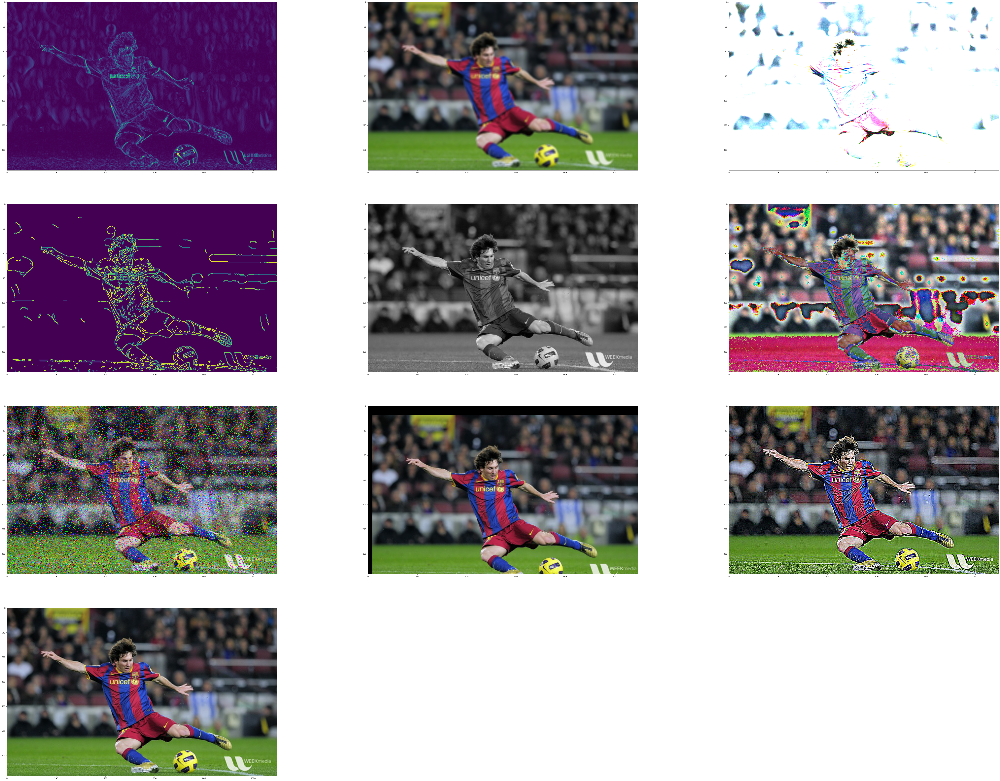

In [27]:
img=plt.imread("/content/sample_data/messi.jpg").astype('uint8')
aug_2=Augmentation_two(img)
method=[aug_2.sobel,aug_2.box, aug_2.bright, aug_2.canny_edge, aug_2.gray, aug_2.random_gama, aug_2.salt_and_pepper, aug_2.shift_left_down, aug_2.sharp,aug_2.scale]
plt.figure(figsize=[90,70])
for i in range(10):
  plt.subplot(4,3,i+1)
  if i==0:
    plt.imshow(method[i](1,0,p=1))
  elif i==4:
    plt.imshow(method[i](p=1),cmap=plt.cm.gray)
  else:
    plt.imshow(method[i](p=1))
plt.show()

#1.f

In [0]:
def find_limit_number(num_img,min_threshold=75,max_threshold=150):
  num_img=num_img.astype('uint8')
  num_img= cv2.Canny(num_img,min_threshold, max_threshold)
  plt.imshow(num_img,cmap=plt.cm.gray)
  plt.show()

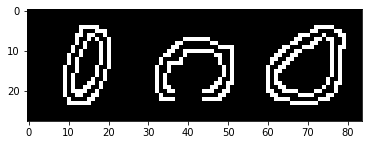

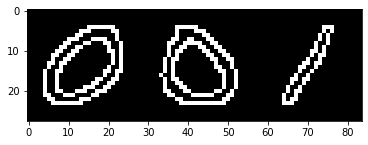

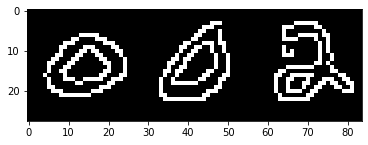

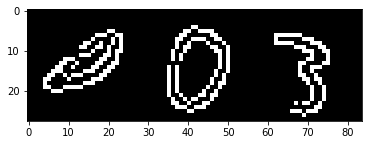

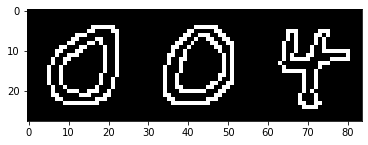

...

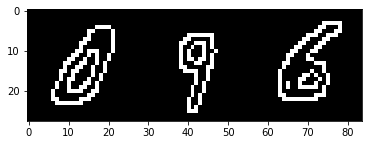

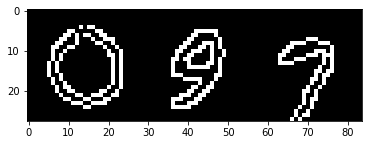

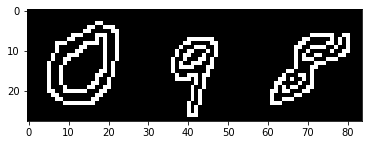

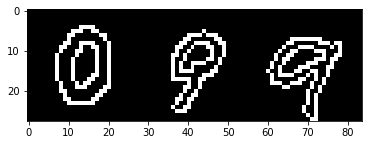

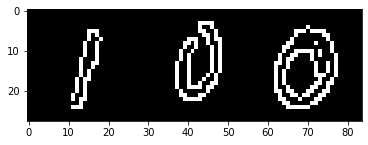

In [29]:
for i in range(101):
  size=np.random.randint(array_new_digits[i].size-1)
  image_num=ndarray_x[array_new_digits[i][size]]
  image_num=find_limit_number(image_num)

#1.g
1.b-1.d divide the y_train(number) by argwhere so all index of some digit will be in some location in ndarray_x.
And to set number to be three digits with 6005 examples,i move on 101 number in the for to get 100 number and each number move  on 6005 to get 6005 example of this number.
to create number i random number of list ndarray_x and two random number.

1.e- create 10 aug with 6 aug will be 16.

1.f- find boundary image with canny

#2

#2.a

In [0]:
def create_triangle():
  img = np.zeros((50, 50, 3), np.uint8)
  color=(np.random.randint(255),np.random.randint(255),np.random.randint(255))
  p1=(np.random.randint(20),np.random.randint(20))
  p2=(np.random.randint(20)+25,np.random.randint(20)+15)
  base=((p1[0]+p2[0])//2,(p1[1]+p2[1])//2)
  height_dist=(np.random.randint(20)+20,np.random.randint(20)+15)
  p3=((base[0]+height_dist[0])%50,(base[1]+height_dist[1])%50)
  cv2.line(img, p1, p2, color, 1) 
  cv2.line(img, p2, p3, color, 1) 
  cv2.line(img, p1, p3, color, 1)
  return img

def create_rectangle():
  img = np.zeros((50, 50, 3), np.uint8)
  color=(np.random.randint(255),np.random.randint(255),np.random.randint(255))
  p1=(np.random.randint(50),np.random.randint(50))
  p2=(np.random.randint(50),np.random.randint(50))
  return cv2.rectangle(img,p1,p2,color,1)

def create_circle_elipse():
  img=np.zeros((50, 50, 3), np.uint8)
  color=(np.random.randint(255),np.random.randint(255),np.random.randint(255))
  center_p=(np.random.randint(45)+2,np.random.randint(45)+2)
  min_r_y=min(center_p[0]+1,49-center_p[0])
  min_r_x=min(center_p[1]+1,49-center_p[1])
  r_y=np.random.randint(min_r_y+1)
  r_x=np.random.randint(min_r_x+1)
  r=min(r_y,r_x)
  return cv2.circle(img,center_p,r , color, 2)



#2.b

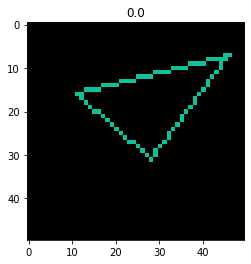

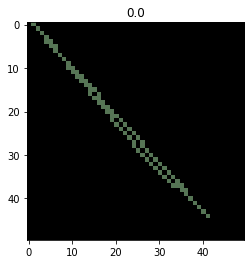

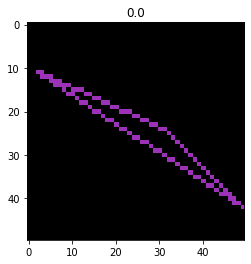

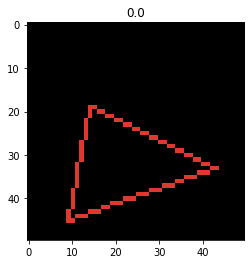

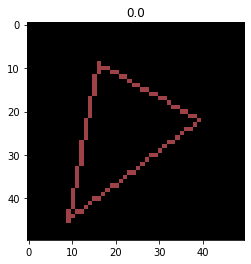

...

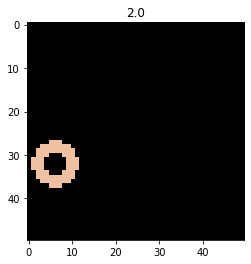

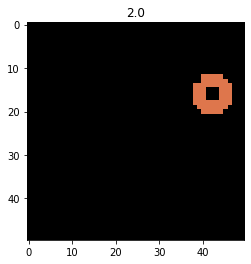

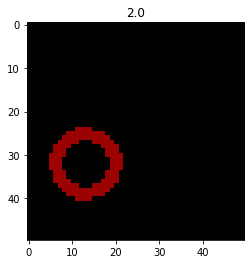

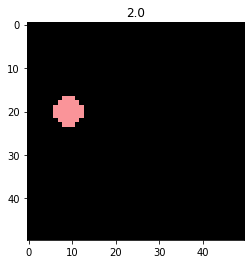

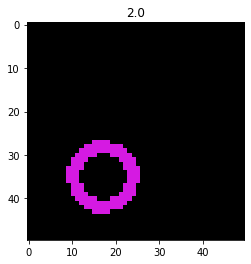

In [31]:
ndarray_x=np.ndarray((900, 50, 50, 3))
ndarray_y=np.ndarray((900,))
for j in range(3):
  list_y=[]
  list_x=[]
  for i in range(300):
    if j==0:
      list_x.append(create_triangle())
      list_y.append(j)
    elif j==1:
      list_x.append(create_rectangle())
      list_y.append(j)
    else:
      list_x.append(create_circle_elipse())
      list_y.append(j)
  y=np.asarray(list_y)
  x=np.asarray(list_x)
  ndarray_x[j*300:(j+1)*300]=x
  ndarray_y[j*300:(j+1)*300]=y
for i in range(0,900,20):
  plt.imshow(ndarray_x[i].astype('uint8'))
  plt.title(str(ndarray_y[i]))
  plt.show()

#label of image y=0-triangle, y=1-rectangle, y=2 cricle 

In [0]:
#Argument for Aug
#First
list_aug_name_1=['gaussian','median']
list_factor_1=[ (3,5), (3,5) ]
p_list_1=[ 0.7,0.5]
#Second
list_aug_name_2=['gaussian','rotate','median']
list_factor_2=[ (3,5), (0,360), (3,5)]
p_list_2=[ 0.4, 0.7, 0.3]
#Object of aug
aug1=create_aug(ndarray_x[0],p_list_1,list_aug_name_1,list_factor_1)
number_aug_for_one_img=5
#Data for shape
x=np.ndarray((number_aug_for_one_img*ndarray_x.shape[0]+ndarray_x.shape[0],50,50,3))
y=np.ndarray((number_aug_for_one_img*ndarray_y.shape[0]+ndarray_y.shape[0],))
#copy the real image and label
x[0:ndarray_x.shape[0]]=ndarray_x
y[0:ndarray_y.shape[0]]=ndarray_y

list_y=[]
list_x=[]
for i in range(ndarray_x.shape[0]):
  for j in range(number_aug_for_one_img):
    if ndarray_y[i]  == 2:
      #for circle don't use rotate 
      aug1=create_aug(ndarray_x[i].astype('uint8'),p_list_1,list_aug_name_1,list_factor_1)
    else:
      aug1=create_aug(ndarray_x[i].astype('uint8'),p_list_2,list_aug_name_2,list_factor_2)
    list_y.append(ndarray_y[i])
    list_x.append((aug1.compose()).astype('uint8'))


for i in range(len(list_x)):
  y[ndarray_y.shape[0]+i:ndarray_y.shape[0]+i+1]=list_y[i]
  x[ndarray_x.shape[0]+i:ndarray_x.shape[0]+i+1]=list_x[i]

  


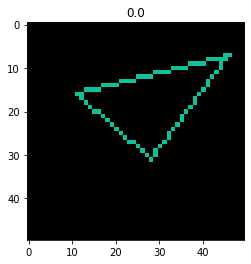

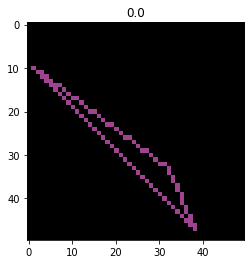

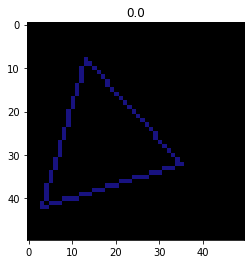

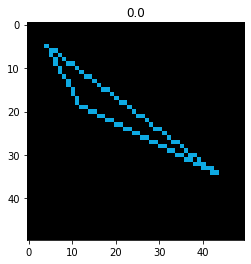

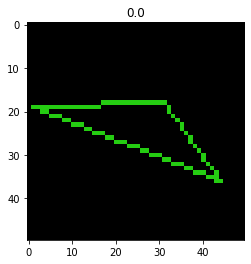

...

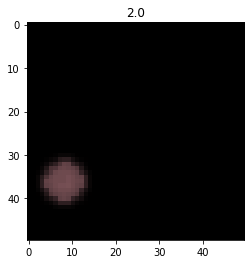

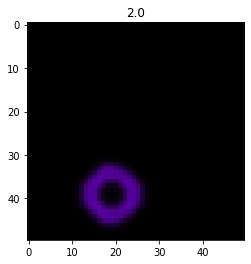

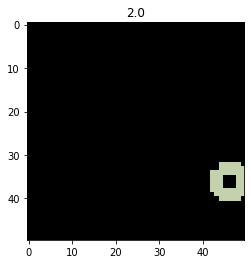

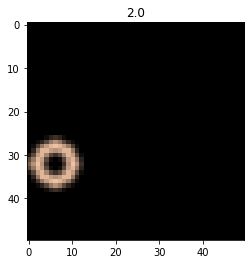

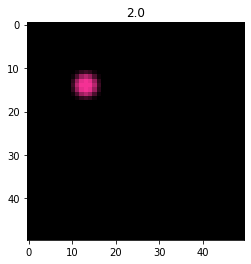

In [33]:
#label of image y=0-triangle, y=1-rectangle, y=2 cricle 
for i in range(0,5000,50):
  plt.imshow(x[i].astype('uint8'))
  plt.title(str(y[i]))
  plt.show()

#2.c

In [0]:
from sklearn.model_selection import train_test_split
class data_load():
  def __init__(self,x,y):
    self.x=x
    self.y=y
  def load_data(self):
    xTrain, xTest, yTrain, yTest = train_test_split(self.x,self.y, test_size = 0.2, random_state = 0)
    return (xTrain,yTrain),(xTest,yTest)

data=data_load(x,y)
(x_train, y_train), (x_test, y_test) = data.load_data()

#Summary

I)I create circle, rectangle,triangle with random method and with opecv.

II)I show the data before and after use augmatation.

I chose to use aug for rectangle and triangle :'gaussian','rotate','median'.

buf for cricle : 'gaussian','median' because rotate don't affect on cricle.

III) Split data with train_test_split

